In [2]:
# Import necessary modules
from pathlib import Path
from vascular_superenhancement.utils.path_config import load_path_config
from vascular_superenhancement.data_management.patients import Patient

# Load the path configuration
config = load_path_config()  # or load_path_config("your_config_name") if you have a specific config

# Create a patient instance
patient = Patient(
    path_config=config,
    # accession_number="ACC123456",  # or phonetic_id="PHON123"
    # phonetic_id="Edengat",
    # phonetic_id="Phidecro",
    phonetic_id="Bukrukesh",
    overwrite_catalogs=False,
    overwrite_images=True,
    debug=True # optional, but preferred if available
)


2025-12-20 21:28:39,134 - DEBUG - Patient Bukrukesh log file: /home/ayeluru/vascular-superenhancement-4d-flow/working_dir/sample_patients/logs/patients/Bukrukesh.log
2025-12-20 21:28:39,163 - DEBUG - Converted 3D Cine series number to integer: 1600
2025-12-20 21:28:39,163 - DEBUG - Successfully initialized Bukrukesh from database


## Testing 4D Flow Nifti creation

In [4]:
print("Testing 4D flow...")
flow_data = patient.get_4d_flow()#as_numpy=True, overwrite=False)  # Get as numpy array
print(f"4D flow shape: {flow_data.keys()}") 
print(f"4D flow shape: {flow_data['mag'].shape}") 
print(f"4D flow shape: {flow_data['vx'].shape}") 
print(f"4D flow shape: {flow_data['vy'].shape}") 
print(f"4D flow shape: {flow_data['vz'].shape}") 



Testing 4D flow...


2025-12-20 21:29:54,745 - INFO - Loaded existing DICOM catalog for patient Bukrukesh
2025-12-20 21:29:54,746 - DEBUG - Accessing 4D Flow catalog for patient Bukrukesh
2025-12-20 21:29:54,746 - DEBUG - 4D Flow catalog not in memory, checking for existing file
2025-12-20 21:29:54,746 - DEBUG - Loading existing 4D Flow catalog from /home/ayeluru/vascular-superenhancement-4d-flow/working_dir/sample_patients/patient_data/Bukrukesh/dicom_catalog_4d-flow_Bukrukesh.csv
2025-12-20 21:29:54,801 - INFO - Successfully loaded existing 4D Flow catalog for patient Bukrukesh
2025-12-20 21:29:54,801 - INFO - Building 4D flow volumes for patient Bukrukesh
2025-12-20 21:29:54,802 - DEBUG - Building mag component with 3240 DICOMs
2025-12-20 21:29:54,872 - INFO - Processing 20 timepoints
2025-12-20 21:30:39,237 - DEBUG - Computed Δs from ΔIPP = 1.600 mm
2025-12-20 21:30:39,238 - DEBUG - [Bukrukesh] Affine components:
  Row vector: [1.00001 0.      0.     ]
  Col vector: [0.      1.00001 0.     ]
  Slice no

4D flow shape: dict_keys(['mag', 'vx', 'vy', 'vz'])
4D flow shape: (256, 256, 162, 20)
4D flow shape: (256, 256, 162, 20)
4D flow shape: (256, 256, 162, 20)
4D flow shape: (256, 256, 162, 20)


2025-12-20 21:33:55,260 - INFO - Saved vz NIfTI to /home/ayeluru/vascular-superenhancement-4d-flow/working_dir/sample_patients/patient_data/Bukrukesh/nifti/4d_flow_vz_Bukrukesh.nii.gz


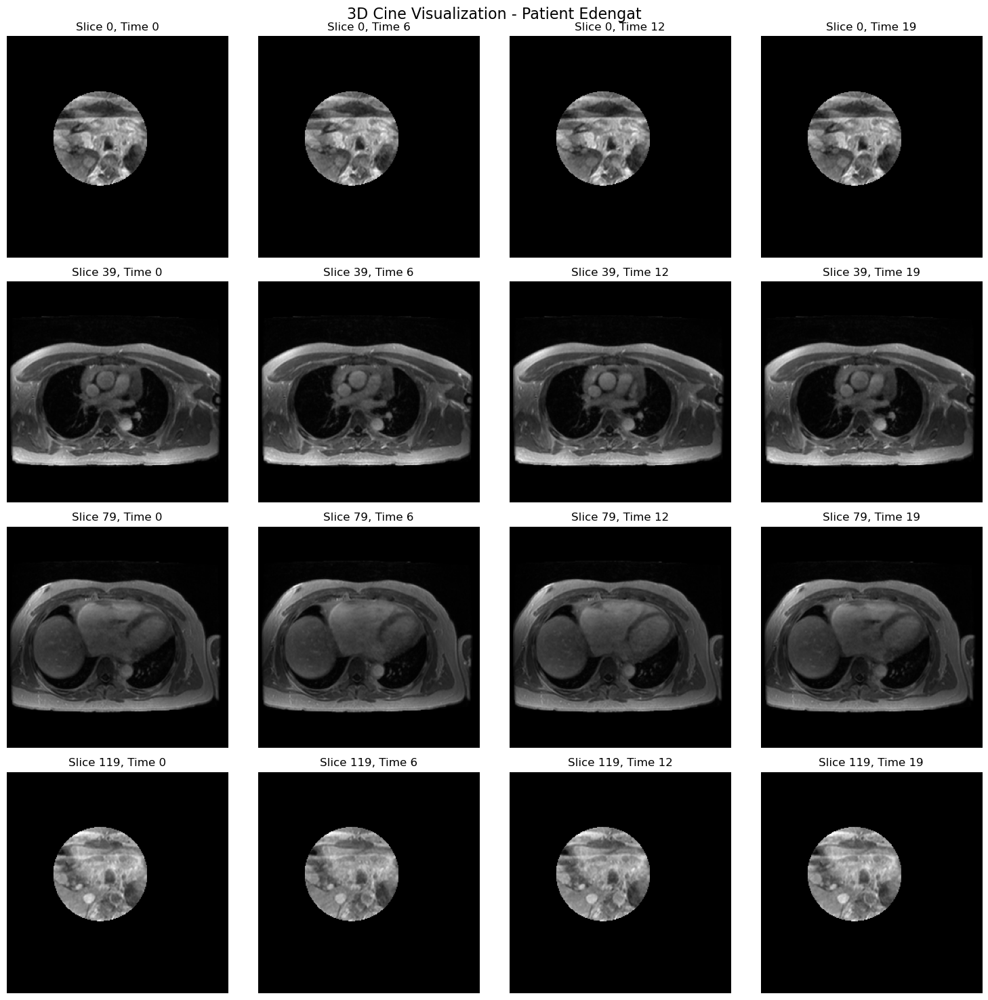

In [14]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_cine(data, n_slices=4, n_times=4):
    """Visualize n_slices slices and n_times time points from the 4D cine data."""
    # Get evenly spaced slices and time points
    slice_indices = np.linspace(0, data.shape[2]-1, n_slices, dtype=int)
    time_indices = np.linspace(0, data.shape[3]-1, n_times, dtype=int)
    
    # Create figure
    fig, axes = plt.subplots(n_slices, n_times, figsize=(15, 15))
    fig.suptitle(f'3D Cine Visualization - Patient {patient.identifier}', fontsize=16)
    
    # Plot each slice and time point
    for i, slice_idx in enumerate(slice_indices):
        for j, time_idx in enumerate(time_indices):
            ax = axes[i, j]
            img = data[:, :, slice_idx, time_idx]
            
            # Display image
            ax.imshow(img, cmap='gray')
            ax.set_title(f'Slice {slice_idx}, Time {time_idx}')
            ax.axis('off')
    
    plt.tight_layout()
    plt.show()

# Visualize the data
visualize_cine(flow_data['mag'])

## Testing 3D Cine Nifti creation

In [2]:
# Test 3D cine
print("Testing 3D cine...")
cine_data = patient.get_3d_cine(as_numpy=True, overwrite=True
                                )  # Get as numpy array
print(f"3D cine shape: {cine_data.shape}")  # Should be (rows, cols, slices, times)


Testing 3D cine...


2025-04-24 14:11:42,878 - INFO - Loaded existing DICOM catalog for patient Bukrukesh
2025-04-24 14:11:42,889 - INFO - Successfully loaded existing 3D Cine catalog for patient Bukrukesh
2025-04-24 14:11:42,889 - INFO - Building 3D cine volume for patient Bukrukesh
2025-04-24 14:11:42,902 - WARNING - [Bukrukesh] Slice order is inferior-to-superior: dot product = 2.000 > 0
2025-04-24 14:12:10,046 - INFO - Flipping data to ensure superior-to-inferior traversal


3D cine shape: (256, 256, 119, 20)


2025-04-24 14:12:21,717 - INFO - Saved 3D cine NIfTI to /mnt/yeluru/vascular-superenhancement-4d-flow/working_dir/sample_patients/patient_data/Bukrukesh/nifti/3d_cine_Bukrukesh.nii.gz


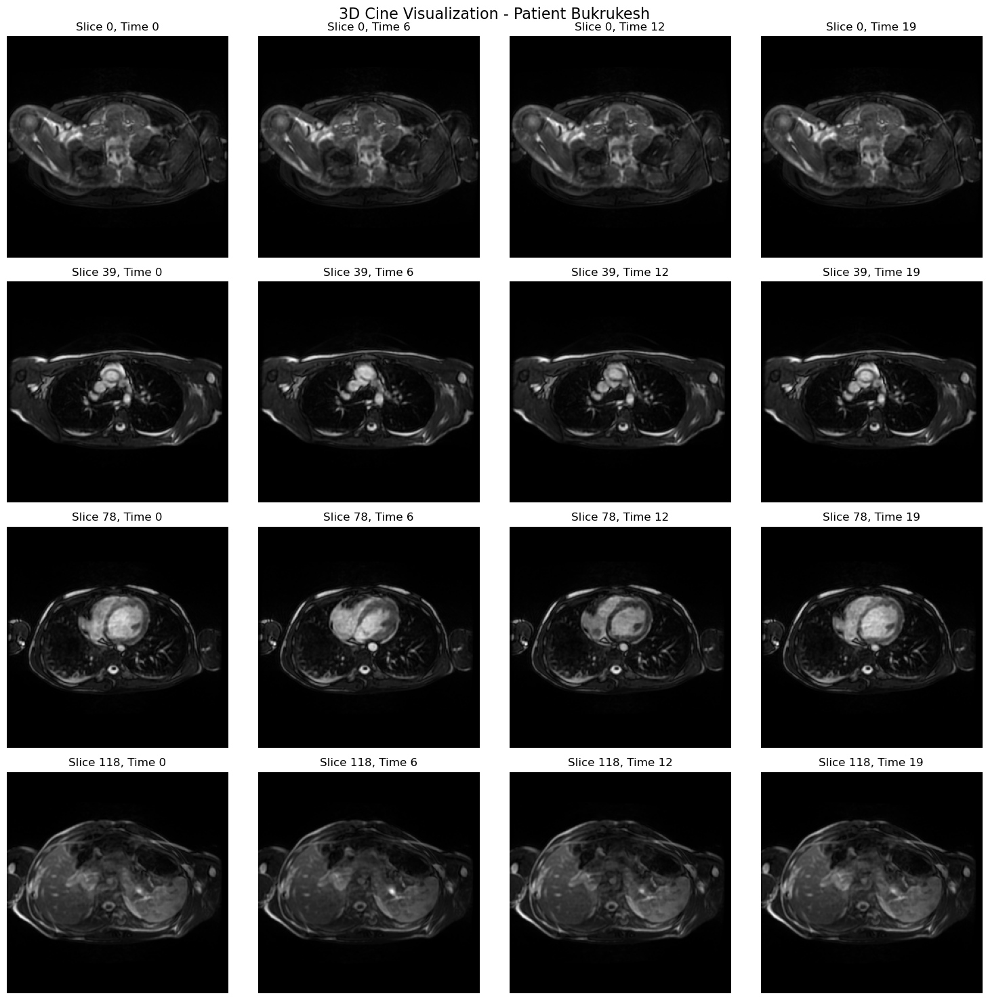

In [3]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_cine(data, n_slices=4, n_times=4):
    """Visualize n_slices slices and n_times time points from the 4D cine data."""
    # Get evenly spaced slices and time points
    slice_indices = np.linspace(0, data.shape[2]-1, n_slices, dtype=int)
    time_indices = np.linspace(0, data.shape[3]-1, n_times, dtype=int)
    
    # Create figure
    fig, axes = plt.subplots(n_slices, n_times, figsize=(15, 15))
    fig.suptitle(f'3D Cine Visualization - Patient {patient.identifier}', fontsize=16)
    
    # Plot each slice and time point
    for i, slice_idx in enumerate(slice_indices):
        for j, time_idx in enumerate(time_indices):
            ax = axes[i, j]
            img = data[:, :, slice_idx, time_idx]
            
            # Display image
            ax.imshow(img, cmap='gray')
            ax.set_title(f'Slice {slice_idx}, Time {time_idx}')
            ax.axis('off')
    
    plt.tight_layout()
    plt.show()

# Visualize the data
visualize_cine(cine_data)

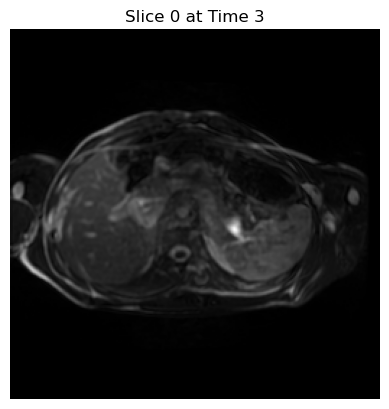

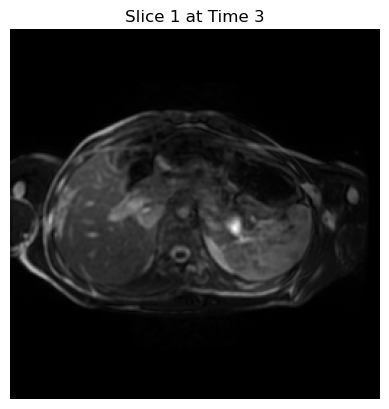

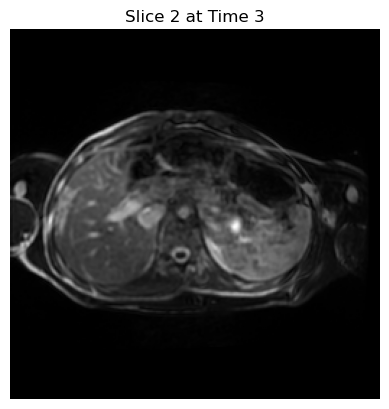

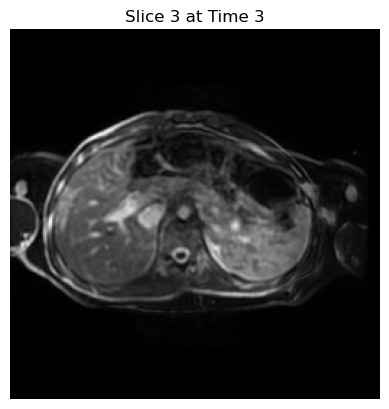

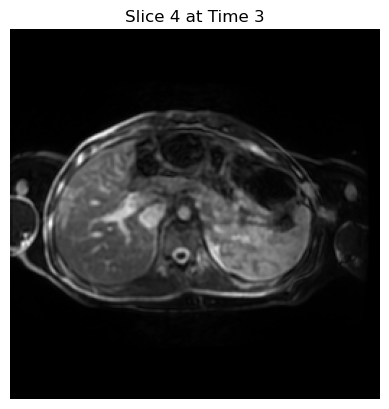

...

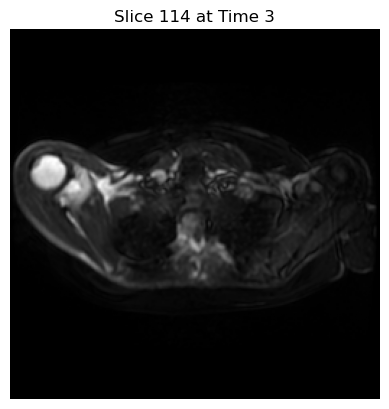

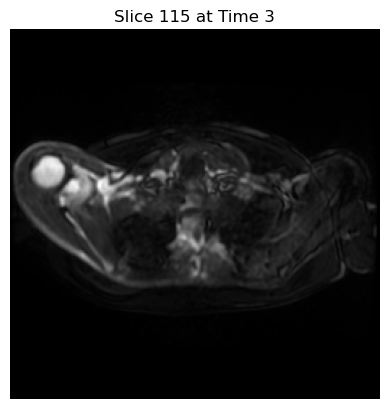

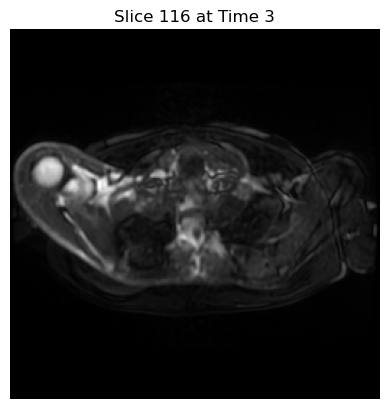

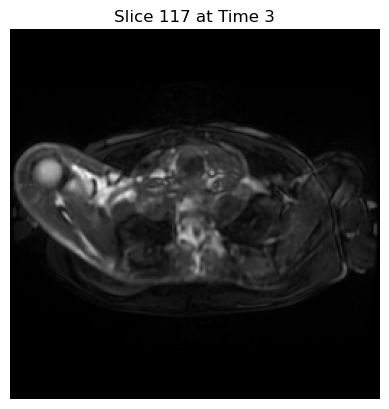

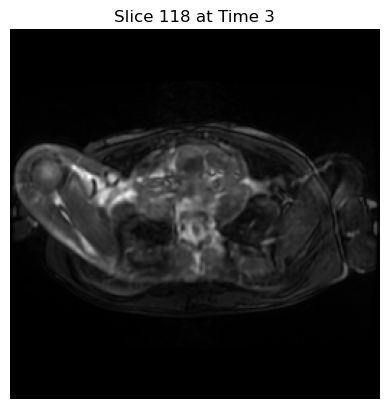

In [15]:
import matplotlib.pyplot as plt
import time

def show_all_slices_at_timepoint(data, timepoint=3, pause=0.5):
    """Iterate through all slices at a given time point and display them."""
    n_slices = data.shape[2]

    for slice_idx in range(n_slices):
        plt.imshow(data[:, :, slice_idx, timepoint], cmap='gray')
        plt.title(f"Slice {slice_idx} at Time {timepoint}")
        plt.axis('off')
        plt.pause(pause)  # Pause to simulate animation
        plt.clf()  # Clear the figure before the next slice

    plt.close()

# Example usage:
show_all_slices_at_timepoint(cine_data, timepoint=3)


## Testing catalogs

In [6]:
patient.dicom_catalog.head()

2025-04-17 18:17:59,781 - INFO - Loaded existing DICOM catalog for patient Bukrukesh


,filepath,patientid,studyinstanceuid,seriesinstanceuid,seriesnumber,sopinstanceuid,modality,studydate,seriesdescription,instancenumber,...,cardiacphasenumber,cardiacnumberofimages,acquisitionnumber,imagesinacquisition,stackid,instackpositionnumber,slicelocation,locationsinacquisition,num3dslabs,locsper3dslab
0,/home/ayeluru/mnt/fourier/repository/vascular-...,NaN,2.25.50698007932306277566771240219294900676,2.25.108274939824193196319162724933162387620,12,2.25.112139206284607947744560969900284080296,MR,NaN,NaN,18,...,18,20,1,20,1.0,1.0,-0.150767,1,0,0
1,/home/ayeluru/mnt/fourier/repository/vascular-...,NaN,2.25.50698007932306277566771240219294900676,2.25.108274939824193196319162724933162387620,12,2.25.129463441622529836364647744406513437186,MR,NaN,NaN,4,...,4,20,1,20,1.0,1.0,-0.150767,1,0,0
2,/home/ayeluru/mnt/fourier/repository/vascular-...,NaN,2.25.50698007932306277566771240219294900676,2.25.108274939824193196319162724933162387620,12,2.25.140399699000913491301878103591687060386,MR,NaN,NaN,16,...,16,20,1,20,1.0,1.0,-0.150767,1,0,0
3,/home/ayeluru/mnt/fourier/repository/vascular-...,NaN,2.25.50698007932306277566771240219294900676,2.25.108274939824193196319162724933162387620,12,2.25.163369617157648543963516500875653135064,MR,NaN,NaN,7,...,7,20,1,20,1.0,1.0,-0.150767,1,0,0
4,/home/ayeluru/mnt/fourier/repository/vascular-...,NaN,2.25.50698007932306277566771240219294900676,2.25.108274939824193196319162724933162387620,12,2.25.181953144003527788777347950856581739956,MR,NaN,NaN,2,...,2,20,1,20,1.0,1.0,-0.150767,1,0,0


In [7]:
patient.dicom_catalog_3d_cine.head()

2025-04-17 18:18:02,773 - INFO - Successfully loaded existing 3D Cine catalog for patient Bukrukesh


,filepath,patientid,studyinstanceuid,seriesinstanceuid,seriesnumber,sopinstanceuid,modality,studydate,seriesdescription,instancenumber,...,acquisitionnumber,imagesinacquisition,stackid,instackpositionnumber,slicelocation,locationsinacquisition,num3dslabs,locsper3dslab,time_index,slice_index
0,/home/ayeluru/mnt/fourier/repository/vascular-...,NaN,2.25.50698007932306277566771240219294900676,2.25.163030857173716970929908361316477815733,1600,2.25.100008417802247656160911005077638142479,MR,NaN,NaN,2111,...,1,2499,1.0,59.0,129.540405,119,2,70,10,105
1,/home/ayeluru/mnt/fourier/repository/vascular-...,NaN,2.25.50698007932306277566771240219294900676,2.25.163030857173716970929908361316477815733,1600,2.25.100055333934786412476541083001217375237,MR,NaN,NaN,2231,...,1,2499,1.0,65.0,141.459290,119,2,70,10,111
2,/home/ayeluru/mnt/fourier/repository/vascular-...,NaN,2.25.50698007932306277566771240219294900676,2.25.163030857173716970929908361316477815733,1600,2.25.100061089171010165349409978055392753174,MR,NaN,NaN,1572,...,1,2499,1.0,32.0,75.905426,119,2,70,11,78
3,/home/ayeluru/mnt/fourier/repository/vascular-...,NaN,2.25.50698007932306277566771240219294900676,2.25.163030857173716970929908361316477815733,1600,2.25.100091407571496646246407027561533533372,MR,NaN,NaN,769,...,1,2499,1.0,41.0,-3.553685,119,2,70,8,38
4,/home/ayeluru/mnt/fourier/repository/vascular-...,NaN,2.25.50698007932306277566771240219294900676,2.25.163030857173716970929908361316477815733,1600,2.25.100257325091676900090537145185910158442,MR,NaN,NaN,178,...,1,2499,1.0,11.0,-63.148014,119,2,70,17,8


In [9]:
patient.delete_catalog('4d_flow')

2025-04-17 18:18:10,207 - INFO - Deleted 4d_flow catalog file: /mnt/yeluru/vascular-superenhancement-4d-flow/working_dir/sample_patients/patient_data/Bukrukesh/dicom_catalog_4d-flow_Bukrukesh.csv


True

In [10]:
patient.dicom_catalog_4d_flow.head()

2025-04-17 18:18:18,779 - INFO - Successfully saved 4D Flow catalog for patient Bukrukesh


,filepath,patientid,studyinstanceuid,seriesinstanceuid,seriesnumber,sopinstanceuid,modality,studydate,seriesdescription,instancenumber,...,acquisitionnumber,imagesinacquisition,stackid,instackpositionnumber,slicelocation,locationsinacquisition,num3dslabs,locsper3dslab,time_index,slice_index
133,/home/ayeluru/mnt/fourier/repository/vascular-...,NaN,2.25.50698007932306277566771240219294900676,2.25.113352986369612818136923901621100073758,4181,2.25.1000799004910541277077460214558275805,MR,NaN,NaN,76,...,1,162,1.0,38.0,-83.31,162,1,162,15,3
134,/home/ayeluru/mnt/fourier/repository/vascular-...,NaN,2.25.50698007932306277566771240219294900676,2.25.113352986369612818136923901621100073758,4181,2.25.100167611431279417932129804474251565908,MR,NaN,NaN,2880,...,1,162,1.0,1440.0,140.69,162,1,162,19,143
135,/home/ayeluru/mnt/fourier/repository/vascular-...,NaN,2.25.50698007932306277566771240219294900676,2.25.113352986369612818136923901621100073758,4181,2.25.100307739191607659693915616442047496498,MR,NaN,NaN,1589,...,1,162,1.0,795.0,38.29,162,1,162,8,79
136,/home/ayeluru/mnt/fourier/repository/vascular-...,NaN,2.25.50698007932306277566771240219294900676,2.25.113352986369612818136923901621100073758,4181,2.25.100314235525285485068635837881550710730,MR,NaN,NaN,328,...,1,162,1.0,164.0,-62.51,162,1,162,7,16
137,/home/ayeluru/mnt/fourier/repository/vascular-...,NaN,2.25.50698007932306277566771240219294900676,2.25.113352986369612818136923901621100073758,4181,2.25.100420063472310083209499144112061088015,MR,NaN,NaN,2185,...,1,162,1.0,1093.0,86.29,162,1,162,4,109


## Testing directories and cine series/descriptions

In [7]:

# Print basic patient information
print(f"Patient identifier: {patient.identifier}")
print(f"Unzipped DICOM directory: {patient.unzipped_dir}")
print(f"Working directory: {patient.working_dir}")

# Both identifiers will be available
print(f"Accession Number: {patient.accession_number}")

# Access cine series as a single value
print(f"3D Cine Series: {patient.three_d_cine_series_number}")

# Access cine series descriptions
print(f"3D Cine Series Description: {patient.three_d_cine_series_description}")


Patient identifier: Phidecro
Unzipped DICOM directory: /home/ayeluru/mnt/fourier/repository/vascular-superenhancement-4d-flow/sample_patients/unzipped_files/Phidecro
Working directory: /mnt/yeluru/vascular-superenhancement-4d-flow/working_dir/sample_patients/patient_data/Phidecro
Accession Number: 58516046
3D Cine Series: 1000
3D Cine Series Description: +C Ax 3D Cine Heart 1BH - Anatomy


In [6]:


# Check if the catalog was loaded/created successfully
if patient.dicom_catalog is not None:
    print(f"\nSuccessfully loaded/created catalog for patient {patient.identifier}")
    print(f"Found {len(patient.dicom_catalog)} DICOM files")
    
    # Show the first few rows of the catalog
    print("\nFirst few rows of the catalog:")
    display(patient.dicom_catalog.head())
    print(patient.dicom_catalog.columns)
    
    # Show unique series descriptions
    print("\nUnique series descriptions:")
    print(patient.dicom_catalog.groupby(['seriesinstanceuid', 'seriesdescription']).size())
else:
    print(f"\nFailed to load/create catalog for patient {patient.identifier}")
    print("Check the logs for more information")



Successfully loaded/created catalog for patient Edengat
Found 17469 DICOM files

First few rows of the catalog:


,filepath,patientid,studyinstanceuid,seriesinstanceuid,seriesnumber,sopinstanceuid,modality,studydate,seriesdescription,instancenumber,imagepositionpatient,imageorientation,pixelspacing,slicethickness,tag_0x0019_0x10B3,tag_0x0043_0x1030,numberoftemporalpositions
0,/home/ayeluru/mnt/fourier/repository/vascular-...,NaN,2.25.269007831170112795120283595253903580060,2.25.101576118586773582804973611048246509663,4231,2.25.100176325011031612446927332717342025652,MR,NaN,NaN,1660,"[-151.303, -165.734, -18.9687]","[0.999965, 0, 0, 0, 0.999965, 0]","[1.4063, 1.4063]",3.2,350.0,3,NaN
1,/home/ayeluru/mnt/fourier/repository/vascular-...,NaN,2.25.269007831170112795120283595253903580060,2.25.101576118586773582804973611048246509663,4231,2.25.100228239425666520191403729569692337828,MR,NaN,NaN,1101,"[-151.303, -165.734, 24.2313]","[0.999965, 0, 0, 0, 0.999965, 0]","[1.4063, 1.4063]",3.2,350.0,3,NaN
2,/home/ayeluru/mnt/fourier/repository/vascular-...,NaN,2.25.269007831170112795120283595253903580060,2.25.101576118586773582804973611048246509663,4231,2.25.10027564355811873447020717335127514940,MR,NaN,NaN,1597,"[-151.303, -165.734, -14.1687]","[0.999965, 0, 0, 0, 0.999965, 0]","[1.4063, 1.4063]",3.2,350.0,3,NaN
3,/home/ayeluru/mnt/fourier/repository/vascular-...,NaN,2.25.269007831170112795120283595253903580060,2.25.101576118586773582804973611048246509663,4231,2.25.100716815584815892957963398134752878632,MR,NaN,NaN,267,"[-151.303, -165.734, 91.4313]","[0.999965, 0, 0, 0, 0.999965, 0]","[1.4063, 1.4063]",3.2,350.0,3,NaN
4,/home/ayeluru/mnt/fourier/repository/vascular-...,NaN,2.25.269007831170112795120283595253903580060,2.25.101576118586773582804973611048246509663,4231,2.25.100751930511537085108541495415754347833,MR,NaN,NaN,733,"[-151.303, -165.734, 54.6313]","[0.999965, 0, 0, 0, 0.999965, 0]","[1.4063, 1.4063]",3.2,350.0,3,NaN


Index(['filepath', 'patientid', 'studyinstanceuid', 'seriesinstanceuid',
       'seriesnumber', 'sopinstanceuid', 'modality', 'studydate',
       'seriesdescription', 'instancenumber', 'imagepositionpatient',
       'imageorientation', 'pixelspacing', 'slicethickness',
       'tag_0x0019_0x10B3', 'tag_0x0043_0x1030', 'numberoftemporalpositions'],
      dtype='object')

Unique series descriptions:
Series([], dtype: int64)
